# Image Acquisition

This project starts from image aquisition where the images collected from various sources are read using varies libraries such as sckit-image, opencv etc. The images in this project are collected from two sources. One dataset is collected from a village in Gilgit-Baltistan, Pakistan and the other dataset is taken from Kaggle.

AxesImage(size=(256, 256))


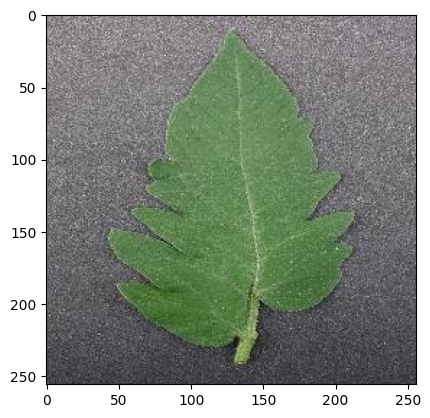

In [1]:
## import the required libraries
import numpy as np
import skimage
import os
from skimage import io
import matplotlib.pyplot as plt
import glob
import cv2


#here i am reading one image from healthy images
healthy_image = "C:/Users/arfan.shah/Desktop/UCA_Undergrad/Arfan_FinalYearProject/dataset1/Tomato___healthy/1.JPG"
healthy = io.imread(healthy_image)
print(plt.imshow(healthy))

#now read one image from 

In [2]:
#her i will read list of images
#this will give us all the directories of all the images in the healthy images folder
h_images = 'C:/Users/arfan.shah/Desktop/UCA_Undergrad/Arfan_FinalYearProject/dataset1/Tomato___healthy/*.JPG'
glob.glob(h_images)

['C:/Users/arfan.shah/Desktop/UCA_Undergrad/Arfan_FinalYearProject/dataset1/Tomato___healthy\\000146ff-92a4-4db6-90ad-8fce2ae4fddd___GH_HL Leaf 259.1.JPG',
 'C:/Users/arfan.shah/Desktop/UCA_Undergrad/Arfan_FinalYearProject/dataset1/Tomato___healthy\\000bf685-b305-408b-91f4-37030f8e62db___GH_HL Leaf 308.1_180deg.JPG',
 'C:/Users/arfan.shah/Desktop/UCA_Undergrad/Arfan_FinalYearProject/dataset1/Tomato___healthy\\000bf685-b305-408b-91f4-37030f8e62db___GH_HL Leaf 308.1_flipTB.JPG',
 'C:/Users/arfan.shah/Desktop/UCA_Undergrad/Arfan_FinalYearProject/dataset1/Tomato___healthy\\000bf685-b305-408b-91f4-37030f8e62db___GH_HL Leaf 308.1_new30degFlipLR.JPG',
 'C:/Users/arfan.shah/Desktop/UCA_Undergrad/Arfan_FinalYearProject/dataset1/Tomato___healthy\\000bf685-b305-408b-91f4-37030f8e62db___GH_HL Leaf 308.1_newPixel25.JPG',
 'C:/Users/arfan.shah/Desktop/UCA_Undergrad/Arfan_FinalYearProject/dataset1/Tomato___healthy\\0031da2a-8edd-468f-a8b1-106657717a32___RS_HL 0105.JPG',
 'C:/Users/arfan.shah/Desktop/

In [3]:
#now we will convert the images into list
healthy_images = [cv2.imread(healthy) for healthy in glob.glob(h_images)]

In [4]:
#now we will find the type of images
#her we can see that the images are convereted successfully into list
type(healthy_images)

list

In [5]:
#her i am finding length of all the images in the list
len(healthy_images)

1926

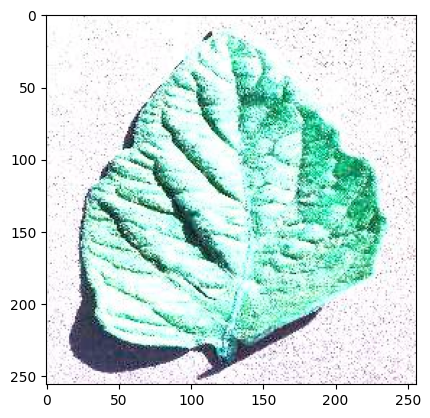

In [6]:
#lets now read one image
plt.imshow(healthy_images[10])

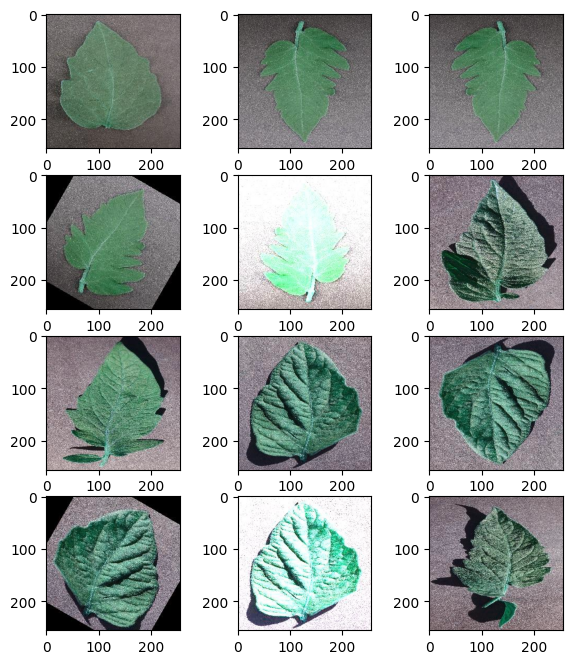

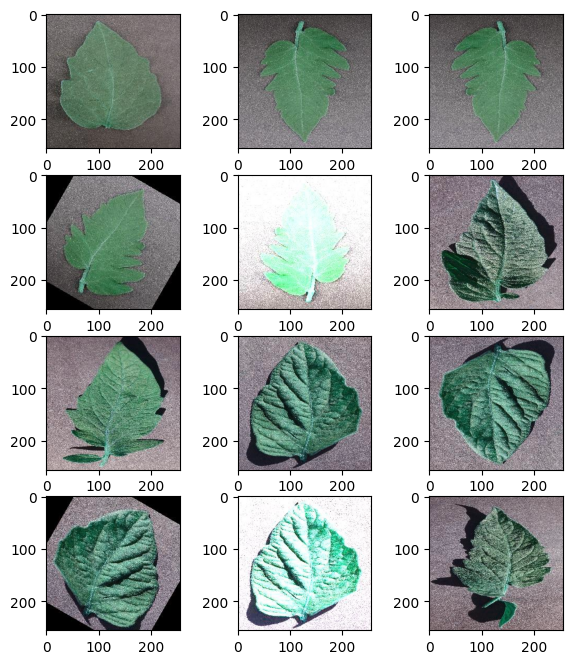

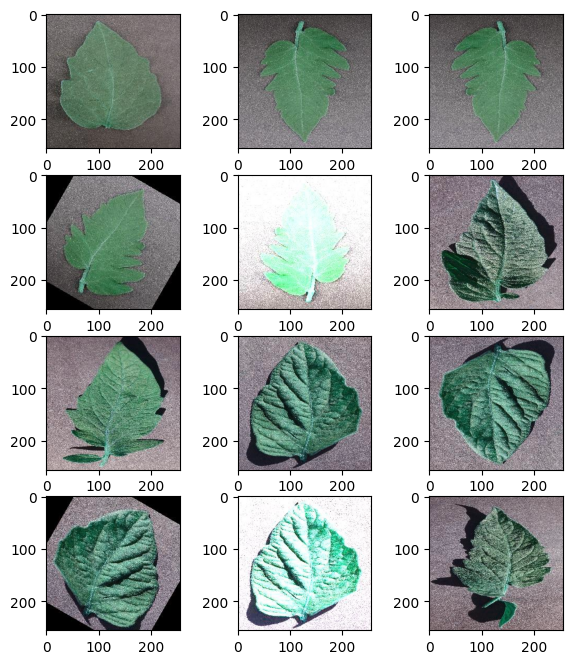

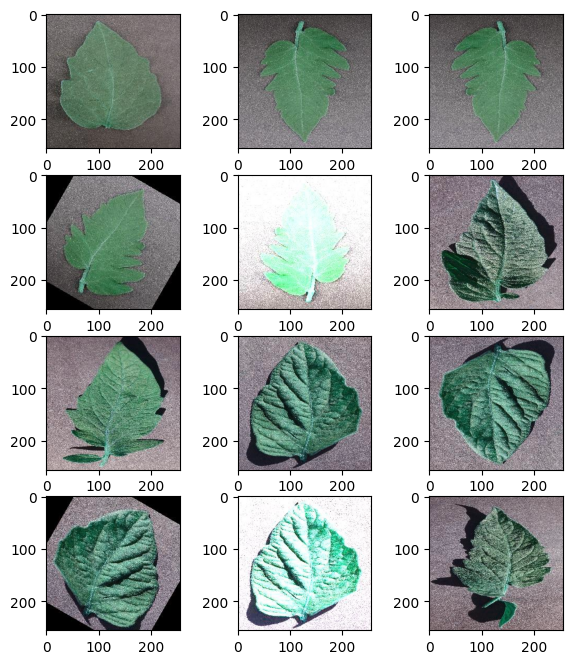

In [7]:
#now lets read a 48 bimages from healthy images at a time
rows = 4
cols = 3

for j in range(0, 48, rows*cols):
    fig = plt.figure(figsize=(7, 8))
    for i in range(0, rows*cols):
        fig.add_subplot(rows, cols, i+1)
        plt.imshow(healthy_images[i])
    plt.show()

# Image Pre-Processing

In the pre-processing part we are going to clean the images while applying differentr filters. We will also use image enhancement, image cropping, image resizing techniques.


### Mean Filter

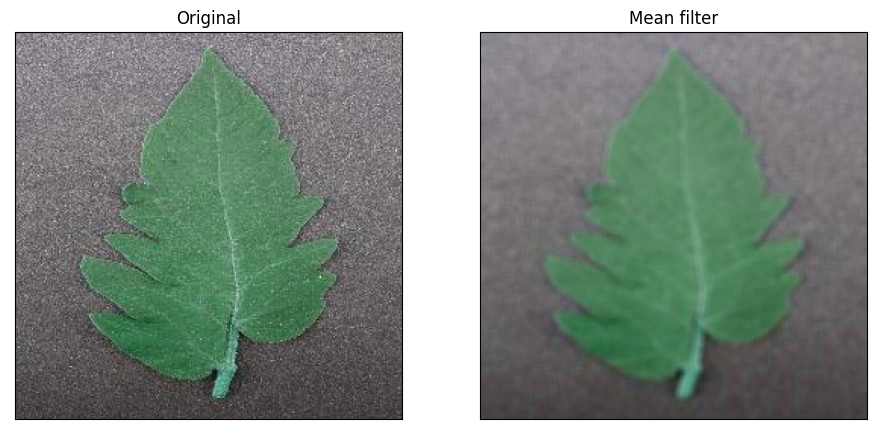

In [8]:
#now lets apply mean filter to reduce noise

from PIL import Image, ImageFilter
%matplotlib inline
#here we are converting HSV
image = cv2.cvtColor(healthy, cv2.COLOR_BGR2HSV) # convert to HSV
figure_size = 5 # the dimension of the x and y axis of the kernal.
meanFiltered_image = cv2.blur(image,(figure_size, figure_size))
plt.figure(figsize=(11,6))
plt.subplot(121), plt.imshow(cv2.cvtColor(image, cv2.COLOR_HSV2RGB)),plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(cv2.cvtColor(meanFiltered_image, cv2.COLOR_HSV2RGB)),plt.title('Mean filter')
plt.xticks([]), plt.yticks([])
plt.show()

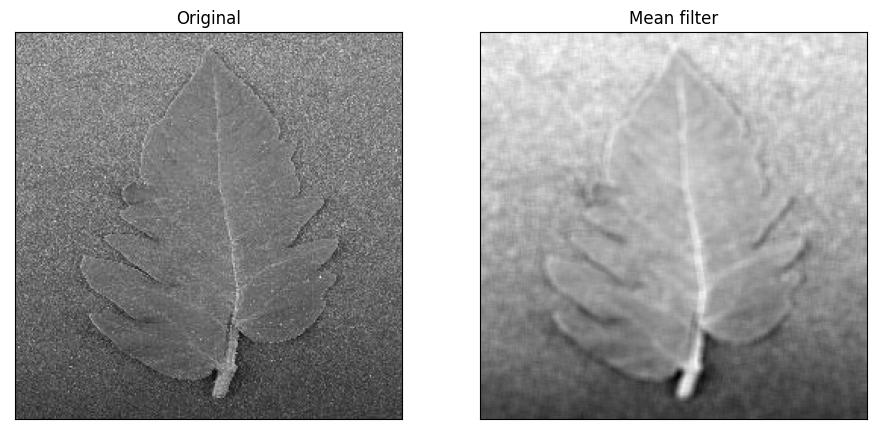

In [9]:
#now lets apply mean filter to the gray scale image

#first lets convert the image into gray scale
image2 = cv2.cvtColor(image, cv2.COLOR_HSV2BGR)
image2 = cv2.cvtColor(image2, cv2.COLOR_BGR2GRAY)
figure_size = 5
grayMeanFiltered_image = cv2.blur(image2,(figure_size, figure_size))
plt.figure(figsize=(11,6))
plt.subplot(121), plt.imshow(image2, cmap='gray'),plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(grayMeanFiltered_image, cmap='gray'),plt.title('Mean filter')
plt.xticks([]), plt.yticks([])
plt.show()

Hence this shows that some noise has been removed by the mean filter.

C:\Users\arfan.shah\AppData\Local\Temp\ipykernel_17052\754566012.py:14: DeprecationWarning: Please use `convolve` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  conv = scipy.ndimage.filters.convolve(healthyImage1, fltr)


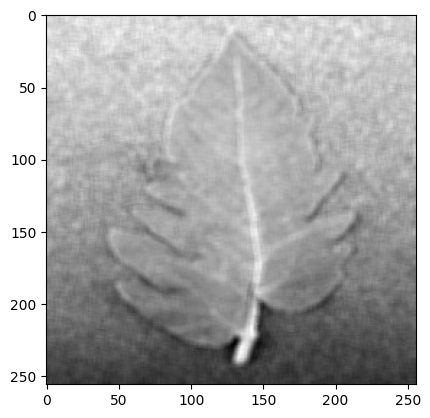

In [10]:
#lets now apply mean filter using scipy, numpy, and PIL
import numpy as np
import scipy
import scipy.ndimage
import PIL
from PIL import Image

healthyImage1=Image.open('C:/Users/arfan.shah/Desktop/UCA_Undergrad/Arfan_FinalYearProject/dataset1/Tomato___healthy/1.JPG').convert('L')

#intialize the mean filter
fltr = np.ones((5, 5))/25

#convolution
conv = scipy.ndimage.filters.convolve(healthyImage1, fltr)

#converting array to image using PIL library
convimage = PIL.Image.fromarray(conv)
plt.imshow(convimage,cmap='gray')
#plt.imshow(convimage)
convimage.save('meanfiltered.jpg')


Advantages of mean filter:
1. Noise Remove
2. enhance overall quality i.e brightens image

Disadvantages of mean filter:
1. while smoothing edges get blurred
2. reduces spatial resolution

### Gaussian Filter

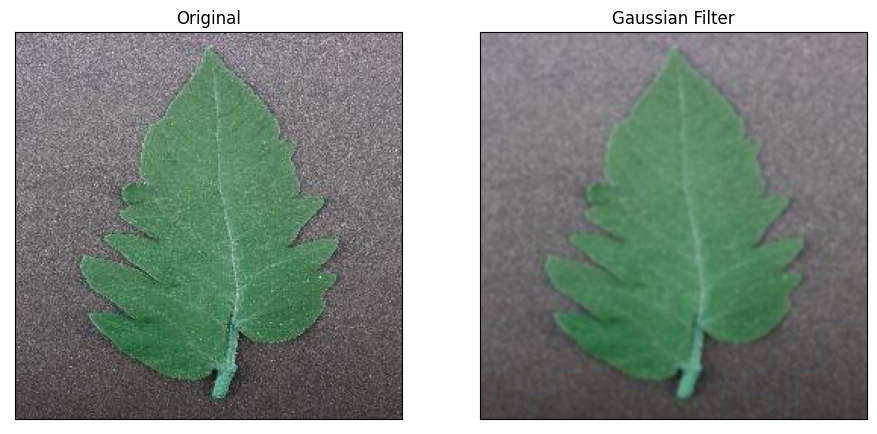

In [11]:
#now lets apply guassian filter
gaussianFiltered_image = cv2.GaussianBlur(image, (figure_size, figure_size),0)
plt.figure(figsize=(11,6))
plt.subplot(121), plt.imshow(cv2.cvtColor(image, cv2.COLOR_HSV2RGB)),plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(cv2.cvtColor(gaussianFiltered_image, cv2.COLOR_HSV2RGB)),plt.title('Gaussian Filter')
plt.xticks([]), plt.yticks([])
plt.show()

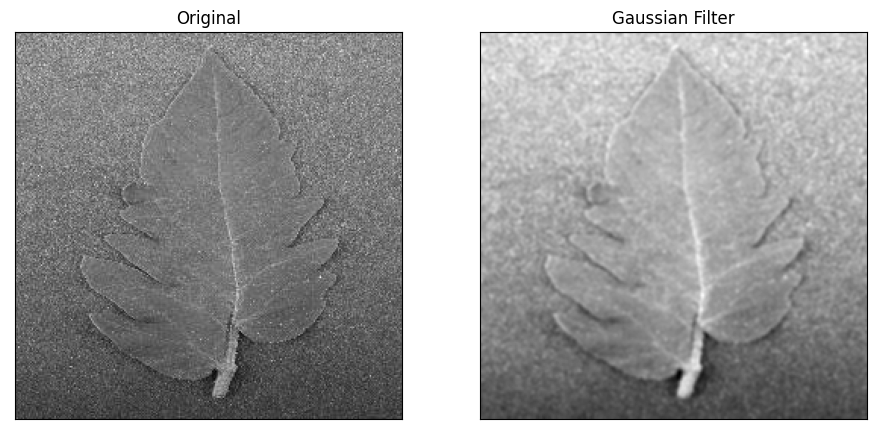

In [12]:
#guassian filter on the gray scale image
gaussianFiltered_grayimage = cv2.GaussianBlur(image2, (figure_size, figure_size),0)
plt.figure(figsize=(11,6))
plt.subplot(121), plt.imshow(image2, cmap='gray'),plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(gaussianFiltered_grayimage, cmap='gray'),plt.title('Gaussian Filter')
plt.xticks([]), plt.yticks([])
plt.show()

### Median Filter

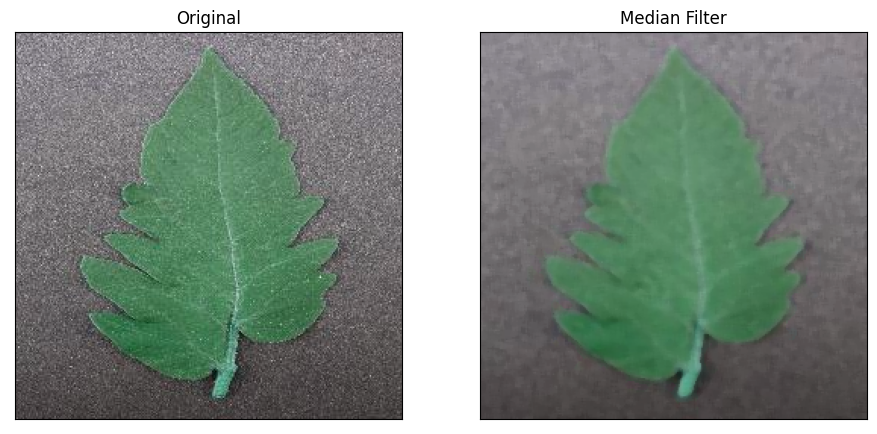

In [13]:
#lets apply median filter which is a non-linear filter
#this median filter can remove salt and pepper noise
medianFiltered_image = cv2.medianBlur(image, figure_size)
plt.figure(figsize=(11,6))
plt.subplot(121), plt.imshow(cv2.cvtColor(image, cv2.COLOR_HSV2RGB)),plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(cv2.cvtColor(medianFiltered_image, cv2.COLOR_HSV2RGB)),plt.title('Median Filter')
plt.xticks([]), plt.yticks([])
plt.show()

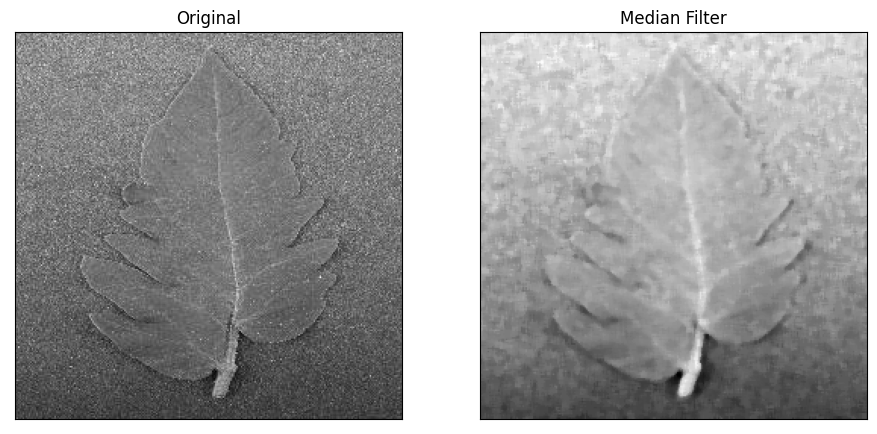

In [14]:
#lets now apply median filter on gray scale image
medianFiltered_grayimage = cv2.medianBlur(image2, figure_size)
plt.figure(figsize=(11,6))
plt.subplot(121), plt.imshow(image2, cmap='gray'),plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(medianFiltered_grayimage, cmap='gray'),plt.title('Median Filter')
plt.xticks([]), plt.yticks([])
plt.show()

C:\Users\arfan.shah\AppData\Local\Temp\ipykernel_17052\3066424134.py:5: DeprecationWarning: Please use `median_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  medianfiltered = scipy.ndimage.filters.median_filter(healthyImage1,size=5, footprint=None, output=None, mode='reflect',cval=0.0,origin =0)


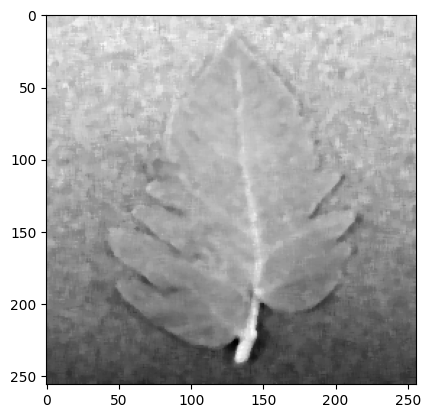

In [15]:
#median filter 
healthyImage1=Image.open('C:/Users/arfan.shah/Desktop/UCA_Undergrad/Arfan_FinalYearProject/dataset1/Tomato___healthy/1.JPG').convert('L')

#apply median filter
medianfiltered = scipy.ndimage.filters.median_filter(healthyImage1,size=5, footprint=None, output=None, mode='reflect',cval=0.0,origin =0)
medianfiltered = Image.fromarray(medianfiltered)
plt.imshow(medianfiltered, cmap='gray')

Most commenly used for removing salt-and-pepper and impluse noise. Salt-and-pepper noise is characterized by black and white spots randomly distributed in an image.

### Min Filter

C:\Users\arfan.shah\AppData\Local\Temp\ipykernel_17052\309362665.py:5: DeprecationWarning: Please use `minimum_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  minfiltered = scipy.ndimage.filters.minimum_filter(healthyImage1, size=5)


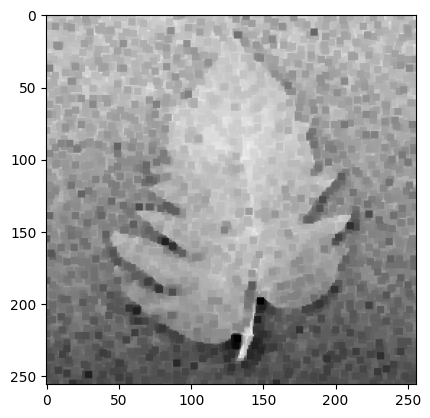

In [16]:
#now applying min filter
healthyImage1=Image.open('C:/Users/arfan.shah/Desktop/UCA_Undergrad/Arfan_FinalYearProject/dataset1/Tomato___healthy/1.JPG').convert('L')

#apply the filter
minfiltered = scipy.ndimage.filters.minimum_filter(healthyImage1, size=5)
minfiltered = Image.fromarray(minfiltered)
plt.imshow(minfiltered, cmap = 'gray')


It enhances the darkest points in an image

### Max Filter

C:\Users\arfan.shah\AppData\Local\Temp\ipykernel_17052\1269685797.py:5: DeprecationWarning: Please use `maximum_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  maxfiltered = scipy.ndimage.filters.maximum_filter(healthyImage1,size=5,footprint=None, output=None, mode='reflect')


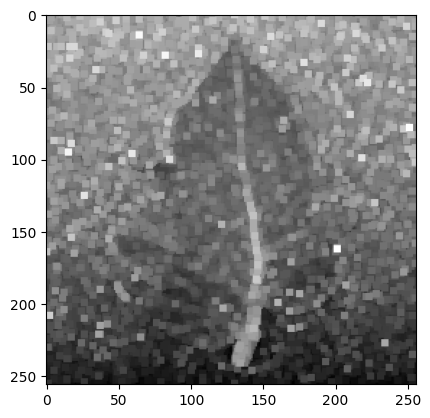

In [17]:
#here i am applying Max filter
healthyImage1=Image.open('C:/Users/arfan.shah/Desktop/UCA_Undergrad/Arfan_FinalYearProject/dataset1/Tomato___healthy/1.JPG').convert('L')

#directly apply max filter
maxfiltered = scipy.ndimage.filters.maximum_filter(healthyImage1,size=5,footprint=None, output=None, mode='reflect')

maxfiltered = Image.fromarray(maxfiltered)
plt.imshow(maxfiltered, cmap='gray')


Max filter enhances the bright points in an image

## First Derivative Filter

An image is not a continuous function and hence derivatives are calculated using discrete approximations. Let us look at the definition of gradient of a continuous function and then extend it to discrete cases. If f(x, y) is a continuous function, then the gradient of f as a vector/

For computational purposes, we consider the simplified version of the gradient is given by Equation 4.5 and angle is given by Equation

            |∇f| = |fx| + |fy|
            θ = tan−1

One of the most popular first derivative filters is the Sobel filter.

The important features of the Sobel filter are:

        The sum of the coefficients in the mask image is 0. This means

that the pixels with constant grayscale are not affected by the derivative filter.

        The side effect of derivative filters is creation of additional noise.

Hence, coefficients of +2 and −2 are used in the mask image to produce smoothing.

    Another first derivative filter is Prewitt.



### Sobel filter

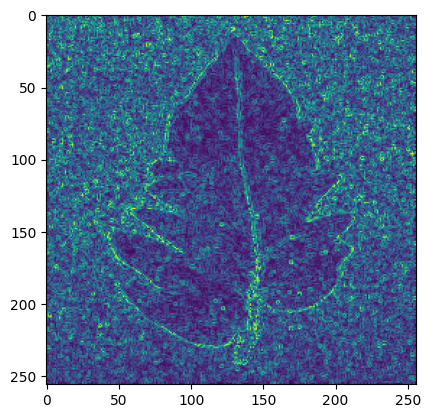

In [18]:
# Load the image and convert it to grayscale
image = cv2.imread('C:/Users/arfan.shah/Desktop/UCA_Undergrad/Arfan_FinalYearProject/dataset1/Tomato___healthy/1.JPG')
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Apply the Sobel filter
sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)

# Combine the x and y gradients
sobel = np.sqrt(np.square(sobel_x) + np.square(sobel_y))
sobel = np.uint8(sobel)
plt.imshow(sobel)

### Prewitt Filter

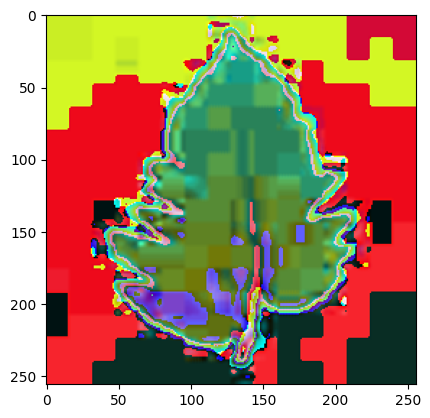

In [19]:
from scipy import ndimage, misc
# Open the image
fig = Image.open('C:/Users/arfan.shah/Desktop/UCA_Undergrad/Arfan_FinalYearProject/dataset1/Tomato___healthy/1.JPG')

result = ndimage.prewitt(fig)

plt.imshow(result, cmap='gray')
d = Image.fromarray(result)
d.save('prewittfiltered.jpg')

### canny filter


* The input of the Canny filter is a grayscale image.
* A Gaussian filter is used on the image for smoothing.
* An important property of an edge pixel is that it will have a maximum gradient magnitude in the direction of the gradient
* At the edge points, the first derivative will have either a minimum or a maximum. This implies that the magnitude (absolute value) of gradient of the image at the edge points is maximum. We will refer to these points as ridge pixels. To identify edge points and suppress others, only ridge tops are retained and other pixels are assigned a value of zero. This process is known as non-maximal suppression.
* Two thresholds, low threshold and high threshold, are then used to threshold the ridges. Ridge pixel values help to classify edge pixels into weak and strong. Ridge pixels with values greater than t5. Two thresholds, low threshold and high threshold, are then used to threshold the ridges. Ridge pixel values help to classify edge pixels into weak and strong. Ridge pixels with values greater than
* In the last step, the weak edge pixels are 8-connected with strong edge pixels.


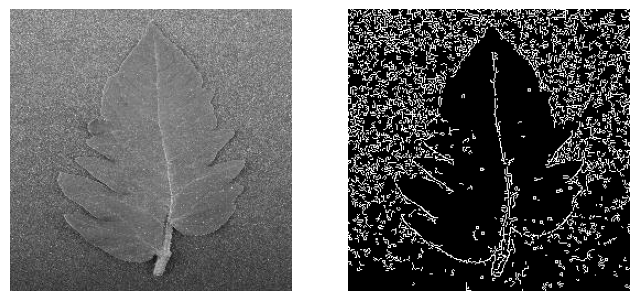

In [20]:
import cv2
import matplotlib.pyplot as plt

# Load the image
im = cv2.imread('C:/Users/arfan.shah/Desktop/UCA_Undergrad/Arfan_FinalYearProject/dataset1/Tomato___healthy/1.JPG', cv2.IMREAD_GRAYSCALE)

# Apply the Canny edge detector
edges = cv2.Canny(im, 100, 200)

# Display the original image and the edge map
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 4))
ax1.imshow(im, cmap='gray')
ax1.axis('off')
ax2.imshow(edges, cmap='gray')
ax2.axis('off')
plt.show()
d = Image.fromarray(edges)
d.save('cannyfiltered.jpg')

## Second Derivative Filters

### Laplacian Filter

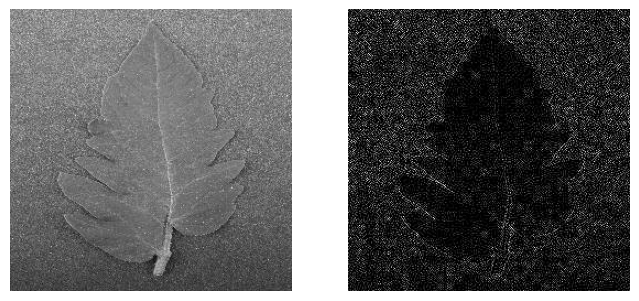

In [21]:
#apply Laplacian filter

# Load the image
im = cv2.imread('C:/Users/arfan.shah/Desktop/UCA_Undergrad/Arfan_FinalYearProject/dataset1/Tomato___healthy/1.JPG', cv2.IMREAD_GRAYSCALE)

# Apply the Laplacian filter
edges = cv2.Laplacian(im, cv2.CV_8U)

# Normalize the edge map to the range [0, 255]
min_val = np.min(edges)
max_val = np.max(edges)
edges = (edges - min_val) / (max_val - min_val)
edges = (edges * 255).astype(np.uint8)

# Display the original image and the edge map
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 4))
ax1.imshow(im, cmap='gray')
ax1.axis('off')
ax2.imshow(edges, cmap='gray')
ax2.axis('off')
plt.show()


### Gaussian_Laplace Filter

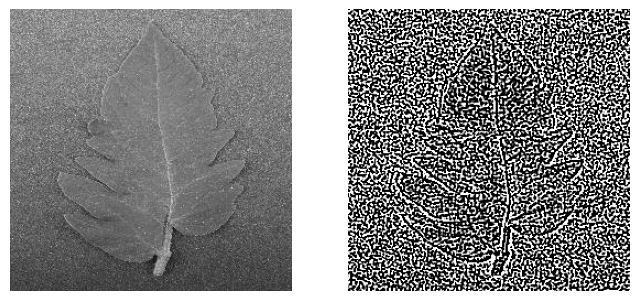

In [22]:

# Load the image
im = cv2.imread('C:/Users/arfan.shah/Desktop/UCA_Undergrad/Arfan_FinalYearProject/dataset1/Tomato___healthy/1.JPG', cv2.IMREAD_GRAYSCALE)

# Apply the Laplacian of Gaussian (LoG) filter
edges = cv2.Laplacian(im, cv2.CV_8U, ksize=5, scale=1)

# Normalize the edge map to the range [0, 255]
min_val = np.min(edges)
max_val = np.max(edges)
edges = (edges - min_val) / (max_val - min_val)
edges = (edges * 255).astype(np.uint8)

# Display the original image and the edge map
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 4))
ax1.imshow(im, cmap='gray')
ax1.axis('off')
ax2.imshow(edges, cmap='gray')
ax2.axis('off')
plt.show()


## Image Enhancement

Image enhancement is a process of improving the visual quality of an image by adjusting its contrast, brightness, color balance, sharpness, or other image characteristics.

### Image Inverse

In [23]:

print(grayMeanFiltered_image)

[[135 138 135 ... 140 145 148]
 [138 139 136 ... 141 145 145]
 [145 143 140 ... 139 143 142]
 ...
 [ 68  71  69 ...  70  70  71]
 [ 69  72  70 ...  70  70  71]
 [ 71  73  72 ...  70  69  70]]


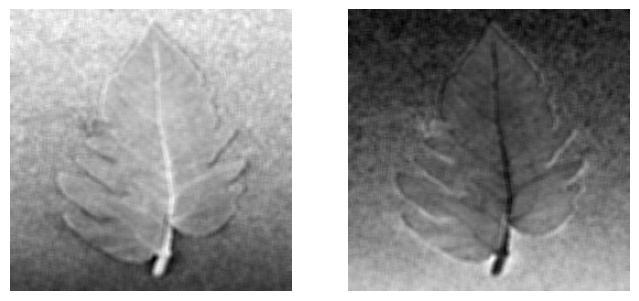

In [24]:
#her I am inverting the image which is acheived after applying mean filter
from PIL import Image

# Open the image
image = Image.fromarray(grayMeanFiltered_image)
#image = Image.open(grayMeanFiltered_image)

# Convert the image to a NumPy array
image_array = np.array(image)

# Invert the colors
inverted_array = 255 - image_array

# Convert the NumPy array back to an image
inverted_image = Image.fromarray(inverted_array.astype(np.uint8))


# showing mean filtered image and inverted image

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 4))
ax1.imshow(grayMeanFiltered_image, cmap='gray')
ax1.axis('off')
ax2.imshow(inverted_image, cmap='gray')
ax2.axis('off')
plt.show()
inverted_image.save('inverted_image.jpg')

### Power Law Transformation

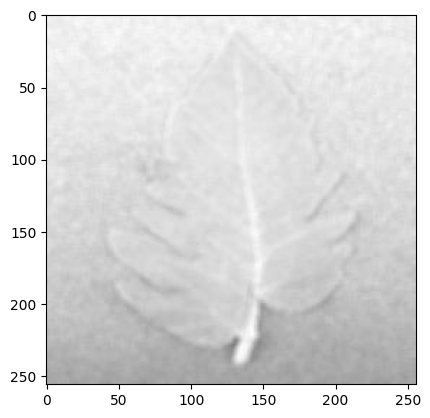

In [25]:
from PIL import Image
import scipy.misc, math
from numpy import asarray

a = Image.open('meanfiltered.jpg').convert('L')
b = asarray(a)

gamma = 0.5

b1 = skimage.img_as_float(b)

b3 = np.max(b1)

b2 = b1/b3

b3 = np.log(b2)*gamma

c = np.exp(b3)*255.0

c1 = c.astype(int)

d = Image.fromarray(c1)

plt.imshow(d)

### Log Transformation

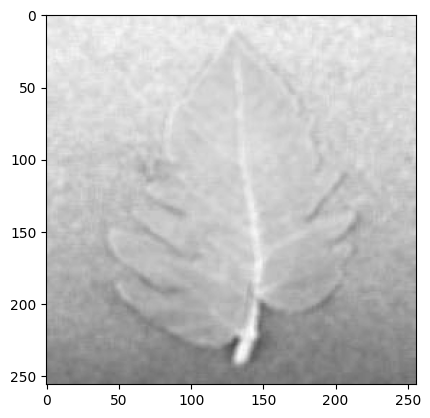

In [26]:
from PIL import Image
import scipy.misc, math
from numpy import asarray

a = Image.open('meanfiltered.jpg').convert('L')
b = asarray(a)

#b1 = b.stype(float)
b1 = skimage.img_as_float(b)

b2 = np.max(b1)

c = (255.0*np.log(1+b1))/np.log(1+b2)

c1 = c.astype(int)

d = Image.fromarray(c1)

plt.imshow(d)
#d.save('LogTransform_image.jpg')

### Histogram Equalization

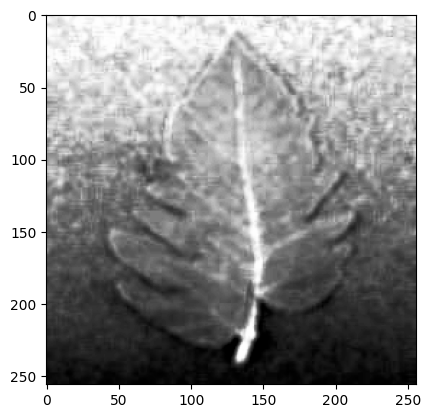

In [27]:
from PIL import Image
import scipy.misc, math
from numpy import asarray
img = Image.open('meanfiltered.jpg').convert('L')
img1 = asarray(img)
f1 = img1.flatten()

hist, bins = np.histogram(img1, 256, [0, 255])

cdf = hist.cumsum()

cdf_m = np.ma.masked_equal(cdf, 0)

num_cdf_m = (cdf_m - cdf_m.min())*255

den_cdf_m = (cdf_m.max() - cdf_m.min())

cdf_m = num_cdf_m/den_cdf_m

cdf = np.ma.filled(cdf_m, 0).astype('uint8')

im2 = cdf[f1]

im3 = np.reshape(im2, img1.shape)

im4 = Image.fromarray(im3)

plt.imshow(im4, cmap='gray')
im4.save('HEqualizer_image.jpg')

### Contrast Stretching

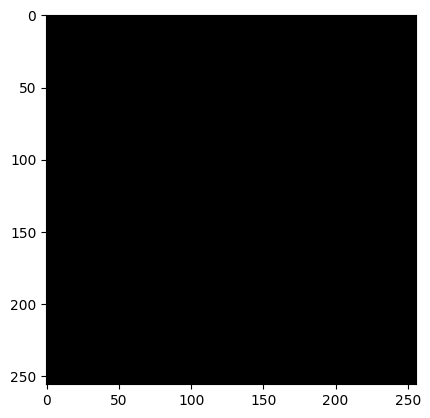

In [28]:
im = Image.open('meanfiltered.jpg').convert('L')
im1 = asarray(im)

b = im1.max()
a = im1.min()

c = skimage.img_as_float(im1)

im2 = 255*(c-a)/(b-a)

im3 = Image.fromarray(im2)

plt.imshow(im3)

## Image Segmentation

Segmentation is partitioning a digital image into multiple segments and the basic purpose is to
simplify the representation of an image into something that is more meaningful and easier to
analyze. Image segmentation is typically used to locate objects and boundaries such as
points, lines, edges and regions in images

### Otsu Segmentation

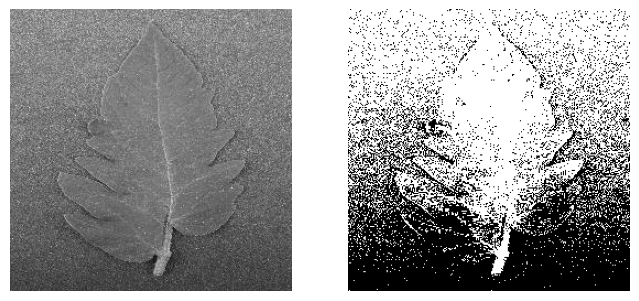

In [29]:
# Load the image
im = cv2.imread('C:/Users/arfan.shah/Desktop/UCA_Undergrad/Arfan_FinalYearProject/dataset1/Tomato___healthy/1.JPG', cv2.IMREAD_GRAYSCALE)

# Apply Otsu's method
_, thresh = cv2.threshold(im, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

# Display the original image and the thresholded image
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 4))
ax1.imshow(im, cmap='gray')
ax1.axis('off')
ax2.imshow(thresh, cmap='gray')
ax2.axis('off')
plt.show()


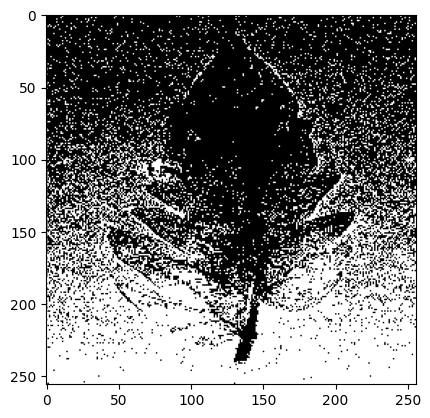

In [30]:
from skimage.filters.thresholding import threshold_otsu

a = Image.open('inverted_image.jpg').convert('L')

a = asarray(a)

thres = threshold_otsu(a)

b = a>thresh

b = Image.fromarray(b)

plt.imshow(b)
b.save('Otsu_image.jpg')

### Watershed Segmentation

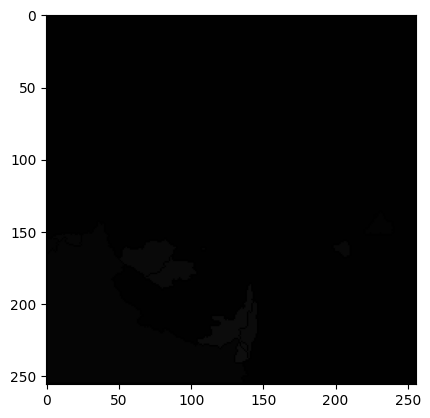

In [31]:
from scipy.ndimage import label

a = cv2.imread('inverted_image.jpg')

a1 = cv2.cvtColor(a, cv2.COLOR_BGR2GRAY)

thresh, b1 = cv2.threshold(a1, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

b2 = cv2.erode(b1, None, iterations=2)

dist_trans = cv2.distanceTransform(b2, 2, 3)

thresh, dt = cv2.threshold(dist_trans, 1, 255, cv2.THRESH_BINARY)

labelled, ncc = label(dt)

labelled = labelled.astype(np.int32)

cv2.watershed(a, labelled)

dt1 = Image.fromarray(labelled)

plt.imshow(dt1, cmap='gray')

# Feature Extraction

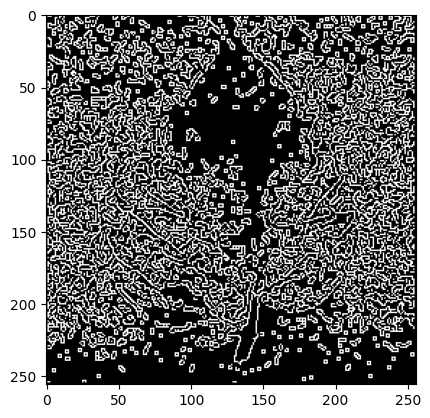

In [32]:
from skimage import feature
import cv2
from PIL import Image
import numpy as np

# Load the image
image = cv2.imread("Otsu_image.jpg")

# Convert the image to grayscale
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Extract features using the Canny edge detector
canny_img = feature.canny(gray_image)

# Show the extracted features
plt.imshow(canny_img, cmap="gray")
plt.show()


In [34]:
import numpy as np
import cv2
import pandas as pd
from skimage.filters import roberts, sobel, scharr, prewitt
 
#img = cv2.imread('BSE_Image.jpg')
img = cv2.imread('Otsu_image.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

#declare empty dataframe so that columns can be added later
df = pd.DataFrame()

img2 = img.reshape(-1)

df['original image'] = img2

#Generate Gabor features
num = 1  
kernels = []  
for theta in range(2):    
    theta = theta / 4. * np.pi
    for sigma in (1, 3):  
        for lamda in np.arange(0, np.pi, np.pi / 4):   
            for gamma in (0.05, 0.5):   
                           
                gabor_label = 'Gabor' + str(num)  

                ksize=9
                kernel = cv2.getGaborKernel((ksize, ksize), sigma, theta, lamda, gamma, 0, ktype=cv2.CV_32F)    
                kernels.append(kernel) 
                fimg = cv2.filter2D(img2, cv2.CV_8UC3, kernel)
                filtered_img = fimg.reshape(-1)
                df[gabor_label] = filtered_img  
                print(gabor_label, ': theta=', theta, ': sigma=', sigma, ': lamda=', lamda, ': gamma=', gamma)
                num += 1  
                
edges = cv2.Canny(img, 100, 200)
edges1 = edges.reshape(-1)
df['canny edge'] = edges1


edge_roberts = roberts(img)
edge_roberts1 = edge_roberts.reshape(-1)
df['roberts'] = edge_roberts1

edge_sobel = sobel(img)
edge_sobel1 = edge_sobel.reshape(-1)
df['sobel'] = edge_sobel1

edge_scharr = scharr(img)
edge_scharr1 = edge_scharr.reshape(-1)
df['scharr'] = edge_scharr1

edge_prewitt = prewitt(img)
edge_prewitt1 = edge_prewitt.reshape(-1)
df['prewitt'] = edge_prewitt1

labelled_img = cv2.imread('prewittfiltered.jpg')
labelled_img = cv2.cvtColor(labelled_img, cv2.COLOR_BGR2GRAY)
labelled_img1 = labelled_img.reshape(-1)

df['labels'] = labelled_img1


df.to_csv("dataset1.csv")
df.head()

Gabor1 : theta= 0.0 : sigma= 1 : lamda= 0.0 : gamma= 0.05
Gabor2 : theta= 0.0 : sigma= 1 : lamda= 0.0 : gamma= 0.5
Gabor3 : theta= 0.0 : sigma= 1 : lamda= 0.7853981633974483 : gamma= 0.05
Gabor4 : theta= 0.0 : sigma= 1 : lamda= 0.7853981633974483 : gamma= 0.5
Gabor5 : theta= 0.0 : sigma= 1 : lamda= 1.5707963267948966 : gamma= 0.05
Gabor6 : theta= 0.0 : sigma= 1 : lamda= 1.5707963267948966 : gamma= 0.5
Gabor7 : theta= 0.0 : sigma= 1 : lamda= 2.356194490192345 : gamma= 0.05
Gabor8 : theta= 0.0 : sigma= 1 : lamda= 2.356194490192345 : gamma= 0.5
Gabor9 : theta= 0.0 : sigma= 3 : lamda= 0.0 : gamma= 0.05
Gabor10 : theta= 0.0 : sigma= 3 : lamda= 0.0 : gamma= 0.5
Gabor11 : theta= 0.0 : sigma= 3 : lamda= 0.7853981633974483 : gamma= 0.05
Gabor12 : theta= 0.0 : sigma= 3 : lamda= 0.7853981633974483 : gamma= 0.5
Gabor13 : theta= 0.0 : sigma= 3 : lamda= 1.5707963267948966 : gamma= 0.05
Gabor14 : theta= 0.0 : sigma= 3 : lamda= 1.5707963267948966 : gamma= 0.5
Gabor15 : theta= 0.0 : sigma= 3 : lamda= 2

,original image,Gabor1,Gabor2,Gabor3,Gabor4,Gabor5,Gabor6,Gabor7,Gabor8,Gabor9,...,Gabor29,Gabor30,Gabor31,Gabor32,canny edge,roberts,sobel,scharr,prewitt,labels
0,0,0,0,255,179,98,58,39,23,0,...,123,81,0,0,0,0.038822,0.013725,0.010294,0.018301,204
1,0,0,0,255,178,96,58,39,23,0,...,0,0,63,46,255,0.668308,0.554123,0.585477,0.522275,204
2,255,0,0,255,169,95,55,39,22,0,...,134,80,255,203,0,0.707129,0.341213,0.431258,0.221292,204
3,0,0,0,153,134,49,43,20,18,0,...,0,0,0,0,255,0.024957,0.544203,0.571752,0.516861,204
4,9,0,0,152,94,49,31,20,12,0,...,57,39,0,0,0,0.016638,0.010605,0.011029,0.014933,204


We got the the above dataset from the image and we have saved it as dataset1.csv

In the dataset there are 39 independent features and the last column as dependent variable